# INTRODUCTION

TThe Demographic and Health Surveys (DHS) is a program that has collected, analyzed, and disseminated accurate and representative data on population, health, HIV, and nutrition through more than 400 surveys in over 90 countries and can be found here:
https://dhsprogram.com/Data/

This notebook, was generated on kaggle and the DHS data loaded into `kaggle/input` directory to do the downstream processing. 

# Data Preprocessing
This step involves intergrating, cleaning and transforming raw data to make it suitable for analysis. 

## 1. Data Integration
This step involves combining data from multiple sources to create a unified dataset. It requires handling data with different formats.

#### Import Libraries

In [1]:
# Import Libraries
import pandas as pd 
import dask.dataframe as dd # memory management 
import missingno as msno
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import gc # Gabagge collection to clear RAM memory
import warnings
warnings.filterwarnings('ignore')#remove the annoying warnings from our cells.
pd.set_option(f'display.max_columns', None) #Display all columns 
print(f'Imported Libraries Successfully!!')

Imported Libraries Successfully!!


#### Create Dataframes
Dataframes for different data records are created using `.DAT`, `.DCT` files in each record and saved as `.csv` files in the `/kaggle/working/` directory

In [2]:
# Path to the main directory containing the subfolders
main_dir = '/kaggle/input/dhs-rawdata'

# Path to the output directory where CSV files will be saved
output_dir = '/kaggle/working'

# Function to parse the .dct file content and determine column names and colspecs 
def parse_dct(dct_path):
    columns = []
    colspecs = []

    with open(dct_path, 'r') as file:
        for line in file:
            line = line.strip()  # Remove leading/trailing whitespace
            
            # Skip irrelevant lines
            if not line or line.startswith(('infix dictionary', '1 lines')):
                continue
            
            parts = line.split()  # Split line into parts
            
            # Skip lines that do not contain enough parts
            if len(parts) < 3:
                continue

            col_name = parts[1]  # Get the column name
            position = parts[-1]  # Get the position string
            
            # Handling the format '1:1000-1018'
            if ':' in position and '-' in position:
                start_end = position.split(':')[-1].strip().split('-')
                start_pos = int(start_end[0])  # Convert to 0-indexed
                end_pos = int(start_end[1])
            # Handling the format '1: 998-998'
            elif '-' in position:
                start_end = position.split('-')
                start_pos = int(start_end[0])   # Convert to 0-indexed
                end_pos = int(start_end[1])
            else:
                print(f"Invalid position format in line: '{line}'")
                continue

            columns.append(col_name)  # Append the column name
            colspecs.append((start_pos, end_pos))  # Append the colspecs
            
    return columns, colspecs

# Loop through all subfolders in the main directory
for subfolder in os.listdir(main_dir):
    subfolder_path = os.path.join(main_dir, subfolder)
    
    # Ensure it's a directory
    if os.path.isdir(subfolder_path):
        # Loop through nested subfolders
        for nested_subfolder in os.listdir(subfolder_path):
            nested_subfolder_path = os.path.join(subfolder_path, nested_subfolder)
            
            # Ensure it's a directory
            if os.path.isdir(nested_subfolder_path):
                # Construct paths for .dct and .dat files
                dct_file_path = os.path.join(nested_subfolder_path, f'{nested_subfolder}.DCT')
                dat_file_path = os.path.join(nested_subfolder_path, f'{nested_subfolder}.DAT')
                csv_file_path = os.path.join(output_dir, f'{nested_subfolder}.csv')
                
                # Check if both .dct and .dat files exist
                if os.path.exists(dct_file_path) and os.path.exists(dat_file_path):
                    # Parse the .dct file to get columns and colspecs
                    columns, colspecs = parse_dct(dct_file_path)

                    # Read the fixed-width .dat file using pandas read_fwf with colspecs
                    hr_df = pd.read_fwf(dat_file_path, colspecs=colspecs, names=columns)

                    # Save the dataframe as a CSV file
                    hr_df.to_csv(csv_file_path, index=False)
                    print(f"Saved {csv_file_path}")
                else:
                    print(f"Missing .DCT or .DAT file for {nested_subfolder}")

print("Processing complete.")


Saved /kaggle/working/UGPR61FL.csv
Saved /kaggle/working/UGBR61FL.csv
Saved /kaggle/working/UGIR61FL.csv
Saved /kaggle/working/UGKR61FL.csv
Saved /kaggle/working/UGCR61FL.csv
Saved /kaggle/working/UGMR61FL.csv
Saved /kaggle/working/UGHR61FL.csv
Processing complete.


#### Import csv data files
Here we create dataframes for the saved `.csv` files in `/kaggle/working/` directory

In [3]:
# Read in the CSV files 
# Function to downcast numeric columns 
def downcast_df(df):
    # Downcast integers
    for col in df.select_dtypes(include=['int']).columns:
        df[col] = pd.to_numeric(df[col], downcast='integer')
    # Downcast floats
    for col in df.select_dtypes(include=['float']).columns:
        df[col] = pd.to_numeric(df[col], downcast='float')
    return df
# Downcast the integers from int64 float64 to int8, float32 respectively
women = downcast_df(pd.read_csv('/kaggle/working/UGIR61FL.csv'))
men = downcast_df(pd.read_csv('/kaggle/working/UGMR61FL.csv'))
children = downcast_df(pd.read_csv('/kaggle/working/UGKR61FL.csv'))
births = downcast_df(pd.read_csv('/kaggle/working/UGBR61FL.csv'))
couples = downcast_df(pd.read_csv('/kaggle/working/UGCR61FL.csv'))
household_member = downcast_df(pd.read_csv('/kaggle/working/UGPR61FL.csv'))
household = downcast_df(pd.read_csv('/kaggle/working/UGHR61FL.csv'))
print('DataFrames read in successfully')

DataFrames read in successfully


Before we begin merging files, we need to sample if there is a possiblity of having colomns with all variables having `nan` values and `nan` means blank in these dataframes

In [4]:
# Identify columns with all NaN values
columns_all_nan = children.columns[children.isna().all()]

# Count columns with all NaN values
count_all_nan_columns = len(columns_all_nan)

# Print the result
print(f"Number of columns with all values as NaN: {count_all_nan_columns}")

Number of columns with all values as NaN: 720


#### Merging datasets
The datsets are merged using the unique identifiers and matching variable tables shown below.

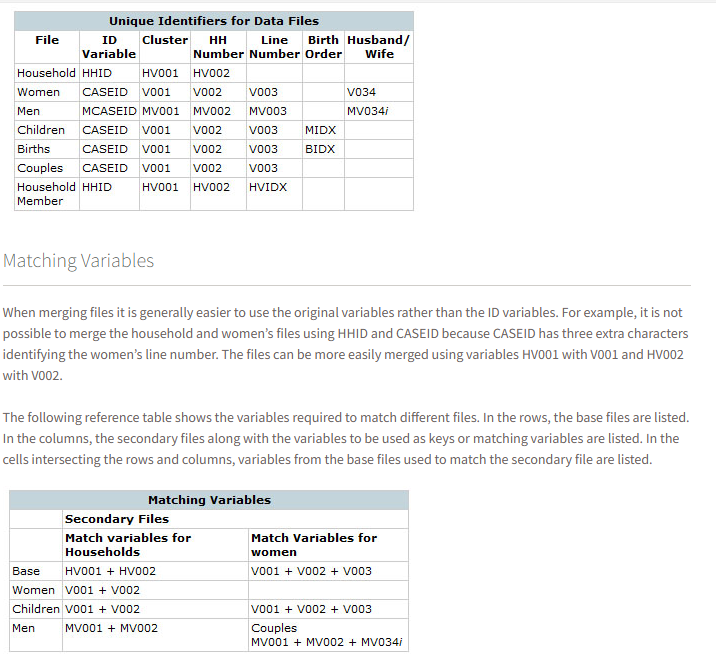

Check the `'bidx'` in births and `'midx'` in children before merging right child to  based on the unique table. these variables links the right child to the right births record.

In [5]:
# Get unique values for bidx in births
unique_values = np.unique(births['bidx'])
unique_count = len(unique_values)# Number of unique values
print(f"Unique values: {unique_values}")
print(f"Number of unique values: {unique_count}")

Unique values: [0 1 2 3 4 5 6 7 8 9]
Number of unique values: 10


In [6]:
# Get unique values for midx in children
unique_values = np.unique(children['midx'])
unique_count = len(unique_values)# Number of unique values
print(f"Unique values: {unique_values}")
print(f"Number of unique values: {unique_count}")

Unique values: [nan]
Number of unique values: 1


In [7]:
# Get unique values for bidx in births
unique_values = np.unique(children['bidx'])
unique_count = len(unique_values)# Number of unique values
print(f"Unique values: {unique_values}")
print(f"Number of unique values: {unique_count}")

Unique values: [1 2 3 4 5]
Number of unique values: 5


Since `'midx'` has all `nan` in children but instead it has `'bidx'` variable as well, then we can merge the datasets.

In [8]:
# Merge births with children
merged_df = pd.merge(births, children, how='outer')
merged_df.head(5)

,caseid,bidx,v000,v001,v002,v003,v004,v005,v006,v007,v008,v009,v010,v011,v012,v013,v014,v015,v016,v017,v018,v019,v019a,v020,v021,v022,v023,v024,v025,v026,v027,v028,v029,v030,v031,v032,v034,v040,v042,v044,v101,v102,v103,v104,v105,v106,v107,v113,v115,v116,v119,v120,v121,v122,v123,v124,v125,v127,v128,v129,v130,v131,v133,v134,v135,v136,v137,v138,v139,v140,v141,v149,v150,v151,v152,v153,awfactt,awfactu,awfactr,awfacte,awfactw,v155,v156,v157,v158,v159,v160,v161,v166,v167,v168,v190,v191,ml101,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v214,v215,v216,v217,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v233,v234,v235,v237,v238,v239,v240,v241,v242,v243,v310,v311,v312,v313,v315,v316,v317,v318,v319,v320,v321,v322,v323,v323a,v325a,v326,v327,v337,v359,v360,v361,v362,v363,v364,v367,v372,v372a,v375a,v376,v376a,v379,v380,v384a,v384b,v384c,v393,v394,v395,v3a00a,v3a00b,v3a00c,v3a00d,v3a00e,v3a00f,v3a00g,v3a00h,v3a00i,v3a00j,v3a00k,v3a00l,v3a00m,v3a00n,v3a00o,v3a00p,v3a00q,v3a00r,v3a00s,v3a00t,v3a00u,v3a00v,v3a00w,v3a00x,v3a00y,v3a00z,v3a01,v3a02,v3a03,v3a04,v3a05,v3a06,v3a07,v3a08a,v3a08b,v3a08c,v3a08d,v3a08e,v3a08f,v3a08g,v3a08h,v3a08i,v3a08j,v3a08k,v3a08l,v3a08m,v3a08n,v3a08o,v3a08p,v3a08q,v3a08r,v3a08s,v3a08t,v3a08u,v3a08v,v3a08w,v3a08aa,v3a08ab,v3a08ac,v3a08ad,v3a08x,v3a08z,v3a09a,v3a09b,v401,v404,v405,v406,v407,v408,v409,v409a,v410,v410a,v411,v411a,v412,v412a,v412b,v412c,v413,v413a,v413b,v413c,v413d,v414a,v414b,v414c,v414d,v414e,v414f,v414g,v414h,v414i,v414j,v414k,v414l,v414m,v414n,v414o,v414p,v414q,v414r,v414s,v414t,v414u,v414v,v414w,v415,v416,v417,v418,v419,v420,v421,v426,v437,v438,v439,v440,v441,v442,v443,v444,v444a,v445,v446,v447,v447a,v452a,v452b,v452c,v453,v454,v455,v456,v457,v458,v459,v460,v461,v462,v463a,v463b,v463c,v463d,v463e,v463f,v463g,v463x,v463z,v464,v465,v466,v467a,v467b,v467c,v467d,v467e,v467f,v467g,v467h,v467i,v467j,v467k,v467l,v467m,v468,v469e,v469f,v469x,v471a,v471b,v471c,v471d,v471e,v471f,v471g,v472a,v472b,v472c,v472d,v472e,v472f,v472g,v472h,v472i,v472j,v472k,v472l,v472m,v472n,v472o,v472p,v472q,v472r,v472s,v472t,v472u,v473a,v473b,v474,v474a,v474b,v474c,v474d,v474e,v474f,v474g,v474h,v474i,v474j,v474x,v474z,v475,v476,v477,v478,v479,v480,v481,v481a,v481b,v481c,v481d,v481e,v481f,v481g,v481h,v481x,v482a,v482b,v482c,v501,v502,v503,v504,v505,v506,v507,v508,v509,v510,v511,v512,v513,v525,v527,v528,v529,v530,v531,v532,v535,v536,v537,v538,v539,v540,v541,v602,v603,v604,v605,v613,v614,v616,v621,v623,v624,v625,v626,v625a,v626a,v627,v628,v629,v631,v632,v633a,v633b,v633c,v633d,v633e,v633f,v633g,v634,v701,v702,v704,v705,v714,v714a,v715,v716,v717,v719,v721,v729,v730,v731,v732,v739,v740,v741,v743a,v743b,v743c,v743d,v743e,v743f,v744a,v744b,v744c,v744d,v744e,v745a,v745b,v746,bord,b0,b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12,b13,b15,b16,midx,m1,m1a,m1b,m1c,m1d,m1e,m2a,m2b,m2c,m2d,m2e,m2f,m2g,m2h,m2i,m2j,m2k,m2l,m2m,m2n,m3a,m3b,m3c,m3d,m3e,m3f,m3g,m3h,m3i,m3j,m3k,m3l,m3m,m3n,m4,m5,m6,m7,m8,m9,m10,m11,m13,m14,m15,m17,m18,m19,m19a,m27,m28,m29,m34,m35,m36,m38,m39a,m39,m42a,m42b,m42c,m42d,m42e,m43,m44,m45,m46,m47,m48,m49a,m49b,m49c,m49d,m49e,m49f,m49g,m49x,m49z,m49y,m50,m51,m52,m54,m55a,m55b,m55c,m55d,m55e,m55f,m55g,m55h,m55i,m55j,m55k,m55l,m55m,m55n,m55o,m55x,m55z,m57a,m57b,m57c,m57d,m57e,m57f,m57g,m57h,m57i,m57j,m57k,m57l,m57m,m57n,m57o,m57p,m57q,m57r,m57s,m57t,m57u,m57v,m57x,m60,m61,m62,m65a,m65b,m65c,m65d,m65e,m65f,m65g,m65h,m65i,m65j,m65k,m65l,m65x,m66,m70,m71,m72,m73,hidx,h1,h2,h2d,h2m,h2y,h3,h3d,h3m,h3y,h4,h4d,h4m,h4y,h5,h5d,h5m,h5y,h6,h6d,h6m,h6y,h7,h7d,h7m,h7y,h8,h8d,h8m,h8y,h9,h9d,h9m,h9y,h0,h0d,h0m,h0y,h10,h11,h11b,h12a,h12b,h12c,h12d,h12e,h12f,h12g,h12h,h12i,h12j,h12k,h12l,h12m,h12n,h12o,h12p,h12q,h12r,h12s,h12t,h12u,h12v,h12w,h12x,h12y,h12z,h13,h13b,h14,h15,h15a,h15b,h15c,h15d,h15e,h15f,h15g,h15h,h15i,h15j,h15k,h15l,h15m,h20,h21a,h21,h22,h31,h31b,h31c,h31d,h31e,h32a,h32b,h32c,h32d,h32e,h32f,h32g,h32h,h32i,h32j,h32k,h32l,h32m,h32n,h32o,h32p,h32q,h32r,h32s,h32t,h32u,h32v,h32w,h32x,h32y,h32z,

Merging women with merged dataframe, will link the right child with their births record to the right woman.
And since the unique variables `caseid,v001, v002,v003` are in both datasets then we can merge the datasets.

In [9]:
print(merged_df.shape)

(28609, 956)


In [10]:
# Merge women with merged_df
merged_df = pd.merge(women, merged_df, how='outer')
merged_df.head(5)

caseid v000  v001  v002  v003  v004     v005  v006  v007  v008  v009  \
0    1 4  1   G6     1     4     1     1   885758     0    11   342     6   
1    1 4  1   G6     1     4     1     1   885758     0    11   342     6   
2    1 4  1   G6     1     4     1     1   885758     0    11   342     6   
3  100 2  2   G6   100     2     2   100  1132267     7    11   339     2   
4  100 2  2   G6   100     2     2   100  1132267     7    11   339     2   

   v010  v011  v012  v013  v014  v015  v016  v017  v018  v019  v019a  v020  \
0   970   846     1   NaN   NaN   NaN     2   273     1     0    NaN   NaN   
1   970   846     1   NaN   NaN   NaN     2   273     1     0    NaN   NaN   
2   970   846     1   NaN   NaN   NaN     2   273     1     0    NaN   NaN   
3   984    20     6   NaN   NaN   NaN     2   273     4     7    NaN   NaN   
4   984    20     6   NaN   NaN   NaN     2   273     4     7    NaN   NaN   

   v021  v022  v023  v024  v025  v026  v027  v028  v029  v030  v031  v032  \
0     1   NaN   NaN     1   NaN   NaN   NaN    54   1.0    50    51   1.0   
1     1   NaN   NaN     1   NaN   NaN   NaN    54   1.0    50    51   1.0   
2     1   NaN   NaN     1   NaN   NaN   NaN    54   1.0    50    51   1.0   
3   100   NaN   NaN     2   NaN   NaN   NaN    34   1.0    30    31   1.0   
4   100   NaN   NaN     2   NaN   NaN   NaN    34   1.0    30    31   1.0   

   v034  v040  v042  v044  v101  v102  v103  v104  v105  v106  v107  v113  \
0   0.0   210   NaN   NaN     1   NaN   NaN   NaN   NaN   NaN   7.0     1   
1   0.0   210   NaN   NaN     1   NaN   NaN   NaN   NaN   NaN   7.0     1   
2   0.0   210   NaN   NaN     1   NaN   NaN   NaN   NaN   NaN   7.0     1   
3   1.0   289   NaN   NaN     2   NaN   NaN   NaN   NaN   NaN   4.0     3   
4   1.0   289   NaN   NaN     2   NaN   NaN   NaN   NaN   NaN   4.0     3   

   v115  v116  v119  v120  v121  v122  v123  v124  v125  v127  v128  v129  \
0    96     1   NaN   NaN   NaN   NaN   NaN   NaN   NaN     5     4     2   
1    96     1   NaN   NaN   NaN   NaN   NaN   NaN   NaN     5     4     2   
2    96     1   NaN   NaN   NaN   NaN   NaN   NaN   NaN     5     4     2   
3    90     2   NaN   NaN   NaN   NaN   NaN   NaN   NaN     1     4     2   
4    90     2   NaN   NaN   NaN   NaN   NaN   NaN   NaN     1     4     2   

   v130  v131  v133  v134  v135  v136  v137  v138  v139  v140  v141  v149  \
0     4     6     7   NaN   NaN     3     0     1     1   NaN   NaN   NaN   
1     4     6     7   NaN   NaN     3     0     1     1   NaN   NaN   NaN   
2     4     6     7   NaN   NaN     3     0     1     1   NaN   NaN   NaN   
3     3     1     1   NaN   NaN     4     2     1     2   NaN   NaN   NaN   
4     3     1     1   NaN   NaN     4     2     1     2   NaN   NaN   NaN   

   v150  v151  v152  v153  awfactt  awfactu  awfactr  awfacte  awfactw  v155  \
0     1   NaN     1   NaN      100      100      100      100      100   NaN   
1     1   NaN     1   NaN      100      100      100      100      100   NaN   
2     1   NaN     1   NaN      100      100      100      100      100   NaN   
3     2   NaN     8   NaN      100      100      100      100      100   NaN   
4     2   NaN     8   NaN      100      100      100      100      100   NaN   

   v156  v157  v158  v159  v160  v161  v166  v167  v168  v190    v191  ml101  \
0   NaN   NaN   NaN   NaN   NaN     7   NaN     0   NaN   NaN  201952    NaN   
1   NaN   NaN   NaN   NaN   NaN     7   NaN     0   NaN   NaN  201952    NaN   
2   NaN   NaN   NaN   NaN   NaN     7   NaN     0   NaN   NaN  201952    NaN   
3   NaN   NaN   NaN   NaN   NaN     8   NaN     3   NaN   NaN   -1939    NaN   
4   NaN   NaN   NaN   NaN   NaN     8   NaN     3   NaN   NaN   -1939    NaN   

   bidx_01  bidx_02  bidx_03  bidx_04  bidx_05  bidx_06  bidx_07  bidx_08  \
0      1.0      2.0      3.0      NaN      NaN      NaN      NaN      NaN   
1      1.0      2.0      3.0      NaN      NaN      NaN      NaN      NaN   
2      1.0      2.0      3.0

Then we have to merge the merged_df with the couples daframe. But, we have to check for the unique variables for `v034`.

In [11]:
couples.head(5)

caseid v000  v001  v002  v003  v004     v005  v006  v007  v008  v009  v010  \
0  217  2   G6     2    17     2     2   604974     9    11   341     9   991   
1  254  2   G6     2    54     2     2   604974     9    11   341     8   989   
2  415  2   G6     4    15     2     4  2500954     9    11   341     3   966   
3  647  2   G6     6    47     2     6   948324     9    11   341     1   980   
4  825  2   G6     8    25     2     8   672692     9    11   341     1   986   

   v011  v012  v013  v014  v015  v016  v017  v018  v019  v019a  v020  v021  \
0   101     0   NaN   NaN   NaN     4   273     2     9    NaN   NaN     2   
1    76     2   NaN   NaN   NaN     6   273     2     9    NaN   NaN     2   
2   795     5   NaN   NaN   NaN     8   273     2     9    NaN   NaN     4   
3   961     1   NaN   NaN   NaN     6   273     2     9    NaN   NaN     6   
4    43     4   NaN   NaN   NaN     0   273     2     9    NaN   NaN     8   

   v022  v023  v024  v025  v026  v027  v028  v029  v030  v031  v032  v034  \
0   NaN   NaN     1   NaN   NaN   NaN    42   1.0    50    51   1.0     1   
1   NaN   NaN     1   NaN   NaN   NaN    42   NaN    50    51   NaN     1   
2   NaN   NaN     1   NaN   NaN   NaN    22   2.0    20    21   2.0     1   
3   NaN   NaN     1   NaN   NaN   NaN    44   1.0    40    41   1.0     1   
4   NaN   NaN     1   NaN   NaN   NaN    63   3.0    60    61   1.0     1   

   v040  v042  v044 mv000  mv001  mv002  mv003  mv004    mv005  mv006  mv007  \
0   177   NaN   NaN    G6      2     17      1      2   814745      9     11   
1   177   NaN   NaN    G6      2     54      1      2   814745      9     11   
2   168   NaN   NaN    G6      4     15      1      4  2526109      9     11   
3   210   NaN   NaN    G6      6     47      1      6  1055037      9     11   
4   200   NaN   NaN    G6      8     25      1      8   649917      9     11   

   mv008  mv009  mv010  mv011  mv012  mv013  mv014  mv015  mv016  mv021  \
0    341      1    974    899      6      5    NaN    NaN      5      2   
1    341      1    984      9      7      3    NaN    NaN      7      2   
2    341      7    972    871      9      5    NaN    NaN      7      4   
3    341      4    978    940      3      4    NaN    NaN      7      6   
4    341      6    979    954      2      4    NaN    NaN      0      8   

   mv022  mv023  mv024  mv025  mv026  mv027  mv028  mv029  mv030  mv031  \
0    NaN    NaN      1    NaN    NaN    NaN     55    1.0     50     51   
1    NaN    NaN      1    NaN    NaN    NaN     55    NaN     50     51   
2    NaN    NaN      1    NaN    NaN    NaN     25    2.0     20     21   
3    NaN    NaN      1    NaN    NaN    NaN     45    1.0     40     41   
4    NaN    NaN      1    NaN    NaN    NaN     65    3.0     60     61   

   mv032  mv034_1  mv034_2  mv034_3  mv034_4  mv034_5  mv034_6  mv034_7  \
0    1.0        2      NaN      NaN      NaN      NaN      NaN      NaN   
1    NaN        2      NaN      NaN      NaN      NaN      NaN      NaN   
2    2.0        2      NaN      NaN      NaN      NaN      NaN      NaN   
3    1.0        2      NaN      NaN      NaN      NaN      NaN      NaN   
4    1.0        2      NaN      NaN      NaN      NaN      NaN      NaN   

   mv034_8  mv034a_1  mv034a_2  mv034a_3  mv034a_4  mv034a_5  mv034a_6  \
0      NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2      NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3      NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4      NaN       NaN       NaN       NaN       NaN       NaN       NaN   

   mv034a_7  mv034a_8  mv034b_1  mv034b_2  mv034b_3  mv034b_4  mv034b_5  \
0       NaN       NaN         0       NaN       NaN       NaN       NaN   
1       NaN       NaN         2       NaN       NaN       NaN       NaN   
2       NaN       NaN         5       NaN       NaN       NaN       NaN   
3    

In [12]:
# Get unique values of v034 in merged_df 
unique_values = np.unique(merged_df['v034'])
unique_count = len(unique_values)# Number of unique values
print(f"Unique values: {unique_values}")
print(f"Number of unique values: {unique_count}")
print("Data type of 'v034' column:", merged_df['v034'].dtype)

Unique values: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. nan]
Number of unique values: 11
Data type of 'v034' column: float32


In [13]:
# Get unique values of v034 in merged_df 
unique_values = np.unique(couples['v034'])
unique_count = len(unique_values)# Number of unique values
print(f"Unique values: {unique_values}")
print(f"Number of unique values: {unique_count}")
print("Data type of 'v034' column:", couples['v034'].dtype)

Unique values: [1 2 3 4 5 6 7 9]
Number of unique values: 8
Data type of 'v034' column: int8


Since they are of different datatype, we have to convert `v034` in couples to `float` for data consistency.

In [14]:
# Convert 'v034' column in couples from integer to float32
couples['v034'] = couples['v034'].astype('float32')
print("Data type of 'v034' column:", couples['v034'].dtype)

Data type of 'v034' column: float32


In [15]:
print(couples.shape)

(1038, 2406)


Since other unique variables are of the same variables names in couples and merged dataframe, we are ready to merge them.

In [16]:
# Merge couples with merged_df
merged_df = pd.merge(couples, merged_df, how='outer')
merged_df.head(5)

caseid v000  v001  v002  v003  v004     v005  v006  v007  v008  v009  \
0    1 4  1   G6     1     4     1     1   885758     0    11   342     6   
1    1 4  1   G6     1     4     1     1   885758     0    11   342     6   
2    1 4  1   G6     1     4     1     1   885758     0    11   342     6   
3  100 2  2   G6   100     2     2   100  1132267     7    11   339     2   
4  100 2  2   G6   100     2     2   100  1132267     7    11   339     2   

   v010  v011  v012  v013  v014  v015  v016  v017  v018  v019  v019a  v020  \
0   970   846     1   NaN   NaN   NaN     2   273     1     0    NaN   NaN   
1   970   846     1   NaN   NaN   NaN     2   273     1     0    NaN   NaN   
2   970   846     1   NaN   NaN   NaN     2   273     1     0    NaN   NaN   
3   984    20     6   NaN   NaN   NaN     2   273     4     7    NaN   NaN   
4   984    20     6   NaN   NaN   NaN     2   273     4     7    NaN   NaN   

   v021  v022  v023  v024  v025  v026  v027  v028  v029  v030  v031  v032  \
0     1   NaN   NaN     1   NaN   NaN   NaN    54   1.0    50    51   1.0   
1     1   NaN   NaN     1   NaN   NaN   NaN    54   1.0    50    51   1.0   
2     1   NaN   NaN     1   NaN   NaN   NaN    54   1.0    50    51   1.0   
3   100   NaN   NaN     2   NaN   NaN   NaN    34   1.0    30    31   1.0   
4   100   NaN   NaN     2   NaN   NaN   NaN    34   1.0    30    31   1.0   

   v034  v040  v042  v044 mv000  mv001  mv002  mv003  mv004      mv005  mv006  \
0   0.0   210   NaN   NaN   NaN    NaN    NaN    NaN    NaN        NaN    NaN   
1   0.0   210   NaN   NaN   NaN    NaN    NaN    NaN    NaN        NaN    NaN   
2   0.0   210   NaN   NaN   NaN    NaN    NaN    NaN    NaN        NaN    NaN   
3   1.0   289   NaN   NaN    G6  100.0    2.0    1.0  100.0  1192649.0    7.0   
4   1.0   289   NaN   NaN    G6  100.0    2.0    1.0  100.0  1192649.0    7.0   

   mv007  mv008  mv009  mv010  mv011  mv012  mv013  mv014  mv015  mv016  \
0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
1    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
2    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
3   11.0  339.0    5.0  983.0    1.0    8.0    3.0    NaN    NaN    2.0   
4   11.0  339.0    5.0  983.0    1.0    8.0    3.0    NaN    NaN    2.0   

   mv021  mv022  mv023  mv024  mv025  mv026  mv027  mv028  mv029  mv030  \
0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
1    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
2    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
3  100.0    NaN    NaN    2.0    NaN    NaN    NaN   35.0    1.0   30.0   
4  100.0    NaN    NaN    2.0    NaN    NaN    NaN   35.0    1.0   30.0   

   mv031  mv032  mv034_1  mv034_2  mv034_3  mv034_4  mv034_5  mv034_6  \
0    NaN    NaN      NaN      NaN      NaN      NaN      NaN      NaN   
1    NaN    NaN      NaN      NaN      NaN      NaN      NaN      NaN   
2    NaN    NaN      NaN      NaN      NaN      NaN      NaN      NaN   
3   31.0    1.0      2.0      NaN      NaN      NaN      NaN      NaN   
4   31.0    1.0      2.0      NaN      NaN      NaN      NaN      NaN   

   mv034_7  mv034_8  mv034a_1  mv034a_2  mv034a_3  mv034a_4  mv034a_5  \
0      NaN      NaN       NaN       NaN       NaN       NaN       NaN   
1      NaN      NaN       NaN       NaN       NaN       NaN       NaN   
2      NaN      NaN       NaN       NaN       NaN       NaN       NaN   
3      NaN      NaN       NaN       NaN       NaN       NaN       NaN   
4      NaN      NaN       NaN       NaN       NaN       NaN       NaN   

   mv034a_6  mv034a_7  mv034a_8  mv034b_1  mv034b_2  mv034b_3  mv034b_4  \
0       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3       NaN       NaN       NaN       6.0  

Since couples record in merged_df links the right woman to the right man, its time to merge men's record. But, we have to first check on the unique variables in men and merged_df.

In [17]:
# Get unique values
unique_values = np.unique(men['mv034_1'])
unique_count = len(unique_values)# Number of unique values
print(f"Unique values: {unique_values}")
print(f"Number of unique values: {unique_count}")

Unique values: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. nan]
Number of unique values: 11


In [18]:
# Get unique values
unique_values = np.unique(merged_df['v034'])
unique_count = len(unique_values)# Number of unique values
print(f"Unique values: {unique_values}")
print(f"Number of unique values: {unique_count}")

Unique values: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. nan]
Number of unique values: 11


In [19]:
# Get unique values
unique_values = np.unique(men['mv002'])
unique_count = len(unique_values)# Number of unique values
print(f"Unique values: {unique_values}")
print(f"Number of unique values: {unique_count}")

Unique values: [ 2  3  4  5  6  7  8  9 10 11 12 13 14 15 17 18 19 20 21 22 23 24 25 26
 27 28 29 30 31 32 33 34 35 36 37 38 39 40 43 44 45 46 47 48 51 53 54 55]
Number of unique values: 48


In [20]:
# Get unique values
unique_values = np.unique(merged_df['v002'])
unique_count = len(unique_values)# Number of unique values
print(f"Unique values: {unique_values}")
print(f"Number of unique values: {unique_count}")

Unique values: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 59 60 61]
Number of unique values: 60


From the checks above, we can see that the variables have the same datatypes but with different variable names. so, we need to rename the variable names of men to match with that of merged_df and then merge them. 

In [21]:
# rename mv001,mv002,mv003 to in men to merge it with merged_df
men = men.rename(columns={'mv001': 'v001','mv002': 'v002','mv003': 'v003'})
men.head(5) 

,mcaseid,mv000,v001,v002,v003,mv004,mv005,mv006,mv007,mv008,mv009,mv010,mv011,mv012,mv013,mv014,mv015,mv016,mv021,mv022,mv023,mv024,mv025,mv026,mv027,mv028,mv029,mv030,mv031,mv032,mv034_1,mv034_2,mv034_3,mv034_4,mv034_5,mv034_6,mv034_7,mv034_8,mv034a_1,mv034a_2,mv034a_3,mv034a_4,mv034a_5,mv034a_6,mv034a_7,mv034a_8,mv034b_1,mv034b_2,mv034b_3,mv034b_4,mv034b_5,mv034b_6,mv034b_7,mv034b_8,mv035,mv801,mv802,mv803,mv101,mv102,mv103,mv104,mv105,mv106,mv107,mv130,mv131,mv133,mv134,mv135,mv136,mv138,mv149,mv150,mv151,mv152,mv155,mv156,mv157,mv158,mv159,mv167,mv168,mv190,mv191,mv201,mv202,mv203,mv204,mv205,mv206,mv207,mv212,mv213,mv217,mv218,mv225,mv245,mv246,mv247,mv248,mv249,mv250,mv251,mv252,mv301,mv302,m304a_01,m304a_02,m304a_03,m304a_04,m304a_05,m304a_06,m304a_07,m304a_08,m304a_09,m304a_10,m304a_11,m304a_12,m304a_13,m304a_14,m304a_15,m304a_16,m304a_17,m304a_18,m304a_19,m304a_20,mv304_01,mv304_02,mv304_03,mv304_04,mv304_05,mv304_06,mv304_07,mv304_08,mv304_09,mv304_10,mv304_11,mv304_12,mv304_13,mv304_14,mv304_15,mv304_16,mv304_17,mv304_18,mv304_19,mv304_20,mv305_01,mv305_02,mv305_03,mv305_04,mv305_05,mv305_06,mv305_07,mv305_08,mv305_09,mv305_10,mv305_11,mv305_12,mv305_13,mv305_14,mv305_15,mv305_16,mv305_17,mv305_18,mv305_19,mv305_20,mv307_01,mv307_02,mv307_03,mv307_04,mv307_05,mv307_06,mv307_07,mv307_08,mv307_09,mv307_10,mv307_11,mv307_12,mv307_13,mv307_14,mv307_15,mv307_16,mv307_17,mv307_18,mv307_19,mv307_20,mv312,mv313,mv323a,mv325b,mv372a,mv384a,mv384b,mv384c,mv395,mv396,mv3a09b,mv3b17,mv3b25a,mv3b25b,mv463a,mv463b,mv463c,mv463d,mv463e,mv463f,mv463g,mv463x,mv463z,mv464,mv474,mv474a,mv474b,mv474c,mv474d,mv474e,mv474f,mv474g,mv474h,mv474i,mv474j,mv474x,mv474z,mv475,mv476,mv477,mv478,mv479,mv480,mv481,mv481a,mv481b,mv481c,mv481d,mv481e,mv481f,mv481g,mv481h,mv481x,mv482a,mv482b,mv482c,mv483,mv483a,mv483b,mv483c,mv501,mv502,mv503,mv504,mv505,mv507,mv508,mv509,mv510,mv511,mv512,mv513,mv525,mv527,mv528,mv529,mv531,mv532,mv535,mv536,mv541,mv602,mv603,mv604,mv605,mv613,mv614,mv616,mv621,mv627,mv628,mv629,mv631,mv633a,mv633b,mv633c,mv633d,mv633e,mv633f,mv633g,mv634a,mv634b,mv634c,mv634d,mv714,mv714a,mv716,mv717,mv719,mv721,mv731,mv732,mv739,mv740,mv741,mv743a,mv743b,mv743c,mv743d,mv743e,mv743f,mv743g,mv744a,mv744b,mv744c,mv744d,mv744e,mv745a,mv745b,mv747a,mv747b,mv750,mv751,mv754bp,mv754cp,mv754dp,mv754jp,mv754wp,mv756,mv761,mv761b,mv761c,mv762aa,mv762ab,mv762ac,mv762ad,mv762ae,mv762af,mv762ag,mv762ah,mv762ai,mv762aj,mv762ak,mv762al,mv762am,mv762an,mv762ao,mv762ap,mv762aq,mv762ar,mv762as,mv762at,mv762au,mv762av,mv762aw,mv762ax,mv762az,mv762ba,mv762bb,mv762bc,mv762bd,mv762be,mv762bf,mv762bg,mv762bh,mv762bi,mv762bj,mv762bk,mv762bl,mv762bm,mv762bn,mv762bo,mv762bp,mv762bq,mv762br,mv762bs,mv762bt,mv762bu,mv762bv,mv762bw,mv762bx,mv762bz,mv763a,mv763b,mv763c,mv763d,mv763e,mv763f,mv763g,mv766a,mv766b,mv767a,mv767b,mv767c,mv768a,mv768b,mv768c,mv769,mv769a,mv770,mv770a,mv770b,mv770c,mv770d,mv770e,mv770f,mv770g,mv770h,mv770i,mv770j,mv770k,mv770l,mv770m,mv770n,mv770o,mv770p,mv770q,mv770r,mv770s,mv770t,mv770u,mv770v,mv770w,mv770x,mv774a,mv774b,mv774c,mv775,mv777,mv778,mv779,mv780,mv781,mv783,mv784a,mv784b,mv784c,mv784d,mv784e,mv784f,mv784g,mv784h,mv784i,mv784j,mv784k,mv784l,mv784m,mv784n,mv784o,mv784p,mv784q,mv784r,mv784s,mv784t,mv784u,mv784v,mv784x,mv785,mv791,mv793,mv793a,mv793b,mv820,mv822,mv823,mv824,mv825,mv826,mv826a,mv827,mv828,mv829,mv832b,mv832c,mv833a,mv833b,mv833c,mv834a,mv834b,mv834c,mv835a,mv835b,mv835c,mv836,mv837,mv844,mv845,mv846,mv847,mv848,mv849,mv851a,mv851b,mv851c,mv851d,mv851e,mv851f,mv851g,mv851h,mv851i,mv851j,mv851k,mv851l,mv852a,mv852b,mv852c,mv853a,mv853b,mv853c,mv854a,mv854b,smqnumb2,smtype,smeligdv,smunhs,smunhsel,smqlang,smilang,smrlang,smtrans,sm105,sm106,sm302d,sm401,sm805a,sm807a,smd044,md005,md101a,md101b,md101c,md101d,md101e,md101f,md101g,md101h,md101i,md101j,md102,md103a,md103b,md103c,md103d,md103e,md103f,md104,md105a,md105b,md105c,md105d,md105e,md105f,md105g,md105h,md105i,md105j,md105k,md105l,md105m,md105n,md106,md107,

In [22]:
print(merged_df.shape)

(30890, 5250)


Based on the data size and memory size at this point while using pandas, the kernel crashed while executing code due to memory insufficient. So we have to use dask convert pandas to dask dataframe for parellel computing for the remaining merging. household_member and merged_df.

In [23]:
# Merge men with merged_df using outer merge
merged_df = pd.merge(merged_df, men, how='outer')
merged_df.head(5)

caseid v000  v001  v002  v003  v004      v005  v006  v007   v008  v009  \
0  1 4  1   G6     1     4     1   1.0  885758.0   0.0  11.0  342.0   6.0   
1  1 4  1   G6     1     4     1   1.0  885758.0   0.0  11.0  342.0   6.0   
2  1 4  1   G6     1     4     1   1.0  885758.0   0.0  11.0  342.0   6.0   
3  112  1   G6     1    12     1   1.0  885758.0   0.0  11.0  342.0   0.0   
4     NaN  NaN     1    19     3   NaN       NaN   NaN   NaN    NaN   NaN   

    v010   v011  v012  v013  v014  v015  v016   v017  v018  v019  v019a  v020  \
0  970.0  846.0   1.0   NaN   NaN   NaN   2.0  273.0   1.0   0.0    NaN   NaN   
1  970.0  846.0   1.0   NaN   NaN   NaN   2.0  273.0   1.0   0.0    NaN   NaN   
2  970.0  846.0   1.0   NaN   NaN   NaN   2.0  273.0   1.0   0.0    NaN   NaN   
3  991.0  102.0   0.0   NaN   NaN   NaN   3.0  273.0   1.0   0.0    NaN   NaN   
4    NaN    NaN   NaN   NaN   NaN   NaN   NaN    NaN   NaN   NaN    NaN   NaN   

   v021  v022  v023  v024  v025  v026  v027  v028  v029  v030  v031  v032  \
0   1.0   NaN   NaN   1.0   NaN   NaN   NaN  54.0   1.0  50.0  51.0   1.0   
1   1.0   NaN   NaN   1.0   NaN   NaN   NaN  54.0   1.0  50.0  51.0   1.0   
2   1.0   NaN   NaN   1.0   NaN   NaN   NaN  54.0   1.0  50.0  51.0   1.0   
3   1.0   NaN   NaN   1.0   NaN   NaN   NaN  42.0   NaN  50.0  51.0   NaN   
4   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   

   v034   v040  v042  v044 mv000  mv001  mv002  mv003  mv004     mv005  mv006  \
0   0.0  210.0   NaN   NaN   NaN    NaN    NaN    NaN    NaN       NaN    NaN   
1   0.0  210.0   NaN   NaN   NaN    NaN    NaN    NaN    NaN       NaN    NaN   
2   0.0  210.0   NaN   NaN   NaN    NaN    NaN    NaN    NaN       NaN    NaN   
3   NaN  210.0   NaN   NaN   NaN    NaN    NaN    NaN    NaN       NaN    NaN   
4   NaN    NaN   NaN   NaN    G6    NaN    NaN    NaN    1.0  933566.0    0.0   

   mv007  mv008  mv009  mv010  mv011  mv012  mv013  mv014  mv015  mv016  \
0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
1    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
2    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
3    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
4   11.0  342.0    5.0  991.0   97.0    0.0    2.0    NaN    NaN    2.0   

   mv021  mv022  mv023  mv024  mv025  mv026  mv027  mv028  mv029  mv030  \
0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
1    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
2    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
3    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
4    1.0    NaN    NaN    1.0    NaN    NaN    NaN   55.0    NaN   50.0   

   mv031  mv032  mv034_1  mv034_2  mv034_3  mv034_4  mv034_5  mv034_6  \
0    NaN    NaN      NaN      NaN      NaN      NaN      NaN      NaN   
1    NaN    NaN      NaN      NaN      NaN      NaN      NaN      NaN   
2    NaN    NaN      NaN      NaN      NaN      NaN      NaN      NaN   
3    NaN    NaN      NaN      NaN      NaN      NaN      NaN      NaN   
4   51.0    NaN      NaN      NaN      NaN      NaN      NaN      NaN   

   mv034_7  mv034_8  mv034a_1  mv034a_2  mv034a_3  mv034a_4  mv034a_5  \
0      NaN      NaN       NaN       NaN       NaN       NaN       NaN   
1      NaN      NaN       NaN       NaN       NaN       NaN       NaN   
2      NaN      NaN       NaN       NaN       NaN       NaN       NaN   
3      NaN      NaN       NaN       NaN       NaN       NaN       NaN   
4      NaN      NaN       NaN       NaN       NaN       NaN       NaN   

   mv034a_6  mv034a_7  mv034a_8  mv034b_1  mv034b_2  mv034b_3  mv034b_4  \
0       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3       NaN       NaN  

Now, we have to merge the household_member with the merged ddataframe based on ` hv001, hv002, hvidx` in household_member and `v001, hv002, hv003,` in merged_df. And this requires us to rename the those variable for merged_df_dask to that of household_member.

In [24]:
# convert merged_df from pandas dataframe to dask dataframe for parallel computing
# to manage memory issue
merged_df_dask = dd.from_pandas(merged_df, npartitions=8)
merged_df_dask.head(5)

caseid  v000  v001  v002  v003  v004      v005  v006  v007   v008  v009  \
0  1 4  1    G6     1     4     1   1.0  885758.0   0.0  11.0  342.0   6.0   
1  1 4  1    G6     1     4     1   1.0  885758.0   0.0  11.0  342.0   6.0   
2  1 4  1    G6     1     4     1   1.0  885758.0   0.0  11.0  342.0   6.0   
3  112  1    G6     1    12     1   1.0  885758.0   0.0  11.0  342.0   0.0   
4    <NA>  <NA>     1    19     3   NaN       NaN   NaN   NaN    NaN   NaN   

    v010   v011  v012  v013  v014  v015  v016   v017  v018  v019  v019a  v020  \
0  970.0  846.0   1.0   NaN   NaN   NaN   2.0  273.0   1.0   0.0    NaN   NaN   
1  970.0  846.0   1.0   NaN   NaN   NaN   2.0  273.0   1.0   0.0    NaN   NaN   
2  970.0  846.0   1.0   NaN   NaN   NaN   2.0  273.0   1.0   0.0    NaN   NaN   
3  991.0  102.0   0.0   NaN   NaN   NaN   3.0  273.0   1.0   0.0    NaN   NaN   
4    NaN    NaN   NaN   NaN   NaN   NaN   NaN    NaN   NaN   NaN    NaN   NaN   

   v021  v022  v023  v024  v025  v026  v027  v028  v029  v030  v031  v032  \
0   1.0   NaN   NaN   1.0   NaN   NaN   NaN  54.0   1.0  50.0  51.0   1.0   
1   1.0   NaN   NaN   1.0   NaN   NaN   NaN  54.0   1.0  50.0  51.0   1.0   
2   1.0   NaN   NaN   1.0   NaN   NaN   NaN  54.0   1.0  50.0  51.0   1.0   
3   1.0   NaN   NaN   1.0   NaN   NaN   NaN  42.0   NaN  50.0  51.0   NaN   
4   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   

   v034   v040  v042  v044 mv000  mv001  mv002  mv003  mv004     mv005  mv006  \
0   0.0  210.0   NaN   NaN  <NA>    NaN    NaN    NaN    NaN       NaN    NaN   
1   0.0  210.0   NaN   NaN  <NA>    NaN    NaN    NaN    NaN       NaN    NaN   
2   0.0  210.0   NaN   NaN  <NA>    NaN    NaN    NaN    NaN       NaN    NaN   
3   NaN  210.0   NaN   NaN  <NA>    NaN    NaN    NaN    NaN       NaN    NaN   
4   NaN    NaN   NaN   NaN    G6    NaN    NaN    NaN    1.0  933566.0    0.0   

   mv007  mv008  mv009  mv010  mv011  mv012  mv013  mv014  mv015  mv016  \
0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
1    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
2    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
3    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
4   11.0  342.0    5.0  991.0   97.0    0.0    2.0    NaN    NaN    2.0   

   mv021  mv022  mv023  mv024  mv025  mv026  mv027  mv028  mv029  mv030  \
0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
1    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
2    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
3    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
4    1.0    NaN    NaN    1.0    NaN    NaN    NaN   55.0    NaN   50.0   

   mv031  mv032  mv034_1  mv034_2  mv034_3  mv034_4  mv034_5  mv034_6  \
0    NaN    NaN      NaN      NaN      NaN      NaN      NaN      NaN   
1    NaN    NaN      NaN      NaN      NaN      NaN      NaN      NaN   
2    NaN    NaN      NaN      NaN      NaN      NaN      NaN      NaN   
3    NaN    NaN      NaN      NaN      NaN      NaN      NaN      NaN   
4   51.0    NaN      NaN      NaN      NaN      NaN      NaN      NaN   

   mv034_7  mv034_8  mv034a_1  mv034a_2  mv034a_3  mv034a_4  mv034a_5  \
0      NaN      NaN       NaN       NaN       NaN       NaN       NaN   
1      NaN      NaN       NaN       NaN       NaN       NaN       NaN   
2      NaN      NaN       NaN       NaN       NaN       NaN       NaN   
3      NaN      NaN       NaN       NaN       NaN       NaN       NaN   
4      NaN      NaN       NaN       NaN       NaN       NaN       NaN   

   mv034a_6  mv034a_7  mv034a_8  mv034b_1  mv034b_2  mv034b_3  mv034b_4  \
0       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3       NaN      

In [25]:
# rename v001,v001,v002  in merged_df_dask to merge it with household_member
merged_df_dask = merged_df_dask.rename(columns={'v001': 'hv001','v002': 'hv002','v003':'hvidx'})
merged_df_dask.head(5)

caseid  v000  hv001  hv002  hvidx  v004      v005  v006  v007   v008  v009  \
0  1 4  1    G6      1      4      1   1.0  885758.0   0.0  11.0  342.0   6.0   
1  1 4  1    G6      1      4      1   1.0  885758.0   0.0  11.0  342.0   6.0   
2  1 4  1    G6      1      4      1   1.0  885758.0   0.0  11.0  342.0   6.0   
3  112  1    G6      1     12      1   1.0  885758.0   0.0  11.0  342.0   0.0   
4    <NA>  <NA>      1     19      3   NaN       NaN   NaN   NaN    NaN   NaN   

    v010   v011  v012  v013  v014  v015  v016   v017  v018  v019  v019a  v020  \
0  970.0  846.0   1.0   NaN   NaN   NaN   2.0  273.0   1.0   0.0    NaN   NaN   
1  970.0  846.0   1.0   NaN   NaN   NaN   2.0  273.0   1.0   0.0    NaN   NaN   
2  970.0  846.0   1.0   NaN   NaN   NaN   2.0  273.0   1.0   0.0    NaN   NaN   
3  991.0  102.0   0.0   NaN   NaN   NaN   3.0  273.0   1.0   0.0    NaN   NaN   
4    NaN    NaN   NaN   NaN   NaN   NaN   NaN    NaN   NaN   NaN    NaN   NaN   

   v021  v022  v023  v024  v025  v026  v027  v028  v029  v030  v031  v032  \
0   1.0   NaN   NaN   1.0   NaN   NaN   NaN  54.0   1.0  50.0  51.0   1.0   
1   1.0   NaN   NaN   1.0   NaN   NaN   NaN  54.0   1.0  50.0  51.0   1.0   
2   1.0   NaN   NaN   1.0   NaN   NaN   NaN  54.0   1.0  50.0  51.0   1.0   
3   1.0   NaN   NaN   1.0   NaN   NaN   NaN  42.0   NaN  50.0  51.0   NaN   
4   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   

   v034   v040  v042  v044 mv000  mv001  mv002  mv003  mv004     mv005  mv006  \
0   0.0  210.0   NaN   NaN  <NA>    NaN    NaN    NaN    NaN       NaN    NaN   
1   0.0  210.0   NaN   NaN  <NA>    NaN    NaN    NaN    NaN       NaN    NaN   
2   0.0  210.0   NaN   NaN  <NA>    NaN    NaN    NaN    NaN       NaN    NaN   
3   NaN  210.0   NaN   NaN  <NA>    NaN    NaN    NaN    NaN       NaN    NaN   
4   NaN    NaN   NaN   NaN    G6    NaN    NaN    NaN    1.0  933566.0    0.0   

   mv007  mv008  mv009  mv010  mv011  mv012  mv013  mv014  mv015  mv016  \
0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
1    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
2    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
3    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
4   11.0  342.0    5.0  991.0   97.0    0.0    2.0    NaN    NaN    2.0   

   mv021  mv022  mv023  mv024  mv025  mv026  mv027  mv028  mv029  mv030  \
0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
1    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
2    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
3    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
4    1.0    NaN    NaN    1.0    NaN    NaN    NaN   55.0    NaN   50.0   

   mv031  mv032  mv034_1  mv034_2  mv034_3  mv034_4  mv034_5  mv034_6  \
0    NaN    NaN      NaN      NaN      NaN      NaN      NaN      NaN   
1    NaN    NaN      NaN      NaN      NaN      NaN      NaN      NaN   
2    NaN    NaN      NaN      NaN      NaN      NaN      NaN      NaN   
3    NaN    NaN      NaN      NaN      NaN      NaN      NaN      NaN   
4   51.0    NaN      NaN      NaN      NaN      NaN      NaN      NaN   

   mv034_7  mv034_8  mv034a_1  mv034a_2  mv034a_3  mv034a_4  mv034a_5  \
0      NaN      NaN       NaN       NaN       NaN       NaN       NaN   
1      NaN      NaN       NaN       NaN       NaN       NaN       NaN   
2      NaN      NaN       NaN       NaN       NaN       NaN       NaN   
3      NaN      NaN       NaN       NaN       NaN       NaN       NaN   
4      NaN      NaN       NaN       NaN       NaN       NaN       NaN   

   mv034a_6  mv034a_7  mv034a_8  mv034b_1  mv034b_2  mv034b_3  mv034b_4  \
0       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2       NaN       NaN       NaN       NaN       NaN       NaN       NaN   

In [26]:
household_member.head(5)

,hhid,hvidx,hv000,hv001,hv002,hv003,hv004,hv005,hv006,hv007,hv008,hv009,hv010,hv011,hv012,hv013,hv014,hv015,hv016,hv017,hv018,hv019,hv020,hv021,hv022,hv023,hv024,hv025,hv026,hv027,hv028,hv030,hv031,hv032,hv035,hv040,hv041,hv042,hv044,hv201,hv202,hv204,hv205,hv206,hv207,hv208,hv209,hv210,hv211,hv212,hv213,hv214,hv215,hv216,hv217,hv218,hv219,hv220,hv221,hv225,hv226,hv227,hv228,hv230a,hv230b,hv232,hv232b,hv232c,hv232d,hv232e,hv232y,hv234,hv234a,hv235,hv236,hv237,hv237a,hv237b,hv237c,hv237d,hv237e,hv237f,hv237g,hv237h,hv237i,hv237j,hv237k,hv237x,hv237z,hv238,hv239,hv240,hv241,hv242,hv243a,hv243b,hv243c,hv243d,hv244,hv245,hv246,hv246a,hv246b,hv246c,hv246d,hv246e,hv246f,hv246g,hv246h,hv246i,hv246j,hv246k,hv247,hv252,hv253,hv253a,hv253b,hv253c,hv253d,hv253e,hv253f,hv253g,hv253h,hv253x,hv253z,hv270,hv271,hml1,hml1a,hml2,shtype,shnumb2,sheligdv,shunhs,shunhsel,shsrtype,shweigha,shqlang,shilang,shrlang,shtrans,shstrth,shstrtm,sh109a,sh110c,sh110h,sh110i,sh110j,sh110k,sh110l,sh110m,sh118g,shendh,shendm,hv101,hv102,hv103,hv104,hv105,hv106,hv107,hv108,hv109,hv110,hv111,hv112,hv113,hv114,hv115,hv116,hv117,hv118,hv120,hv121,hv122,hv123,hv124,hv125,hv126,hv127,hv128,hv129,hv140,idxh4,sh17a,sh17b,sh19a,sh19b,sh20,sh21,sh22,sh23,sh24,sh25,sh26,sh27,sh28,sh29,ha0,ha1,ha2,ha3,ha4,ha5,ha6,ha11,ha12,ha12a,ha12b,ha13,ha32,ha33,ha35,ha40,ha41,ha50,ha51,ha52,ha53,ha54,ha55,ha56,ha57,ha58,ha60,ha61,ha62,ha63,ha64,ha65,ha66,ha67,ha68,ha69,ha70,hc0,hc1,hc2,hc3,hc4,hc5,hc6,hc7,hc8,hc9,hc10,hc11,hc12,hc13,hc15,hc16,hc17,hc18,hc19,hc27,hc30,hc31,hc32,hc33,hc51,hc52,hc53,hc55,hc56,hc57,hc58,hc60,hc61,hc62,hc63,hc64,hc68,hc70,hc71,hc72,hc73,hb0,hb1,hb2,hb3,hb4,hb5,hb6,hb11,hb12,hb12a,hb12b,hb13,hb32,hb33,hb35,hb40,hb41,hb50,hb51,hb52,hb53,hb55,hb56,hb57,hb58,hb60,hb61,hb62,hb63,hb64,hb65,hb66,hb67,hb68,hb69,hb70,hmlidx,hml3,hml4,hml5,hml6,hml7,hml8,hml9,hml10,hml11,hml21,hmla,hmlb,hmlc,hmld,hmle,hmhidx,hml12,hml13,hml14,hml15,hml16,hml16a,hml17,hml18,hml19,hml20,hml30,hml31,hml32,hml32a,hml32b,hml32c,hml32d,hml32e,hml32f,hml32g,hml33,hml34,hml35,shx01,sh211b,sh211c,sh213,shcvar,shcrbp,shcvad,sha0,shvacon,sh227a,sh227b,sh231a,sh231b,sh239,shwvar,shwrbp,shwvad
0,1 2,1,G6,1,2,1,1,821594,0,11,342,2,0,0,2,2,0,NaN,2,NaN,42,NaN,NaN,1,NaN,NaN,1,NaN,NaN,NaN,0,50,51,NaN,0,210,0,NaN,NaN,3,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,4,2,1,NaN,1,NaN,5,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,NaN,0,NaN,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,209230,2,NaN,0,NaN,7,NaN,NaN,NaN,NaN,748159,5,8,2,NaN,1,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,4,1,NaN,NaN,NaN,5,NaN,3.0,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,2.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1 2,2,G6,1,2,1,1,821594,0,11,342,2,0,0,2,2,0,NaN,2,NaN,42,NaN,NaN,1,NaN,NaN,1,NaN,NaN,NaN,0,50,51,NaN,0,210,0,NaN,NaN,3,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,4,2,1,NaN,1,NaN,5,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,NaN,0,NaN,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,209230,2,NaN,0,NaN,7,N

In [27]:
# Merge household member with merged_df_dask
merged_df_dask = dd.merge(household_member,merged_df_dask, how='outer')
merged_df_dask.head(5)

hhid  hvidx hv000  hv001  hv002  hv003  hv004      hv005  hv006  hv007  \
0  29 2      0    G6     29      2    4.0   29.0  1169172.0    9.0   11.0   
1  3148      0    G6     31     48    1.0   31.0  1041226.0    0.0   11.0   
2  78 2      0    G6     78      2    1.0   78.0   215301.0    7.0   11.0   
3  8060      0    G6     80     60    2.0   80.0   268878.0    8.0   11.0   
4  8649      0    G6     86     49    1.0   86.0  1466032.0    6.0   11.0   

   hv008  hv009  hv010  hv011  hv012  hv013  hv014  hv015  hv016  hv017  \
0  341.0    9.0    3.0    5.0    9.0    9.0    3.0    NaN    6.0    NaN   
1  342.0    2.0    4.0    3.0    2.0    2.0    2.0    NaN    3.0    NaN   
2  339.0    1.0    0.0    0.0    8.0    1.0    0.0    NaN    7.0    NaN   
3  340.0    0.0    4.0    0.0    9.0    0.0    1.0    NaN    0.0    NaN   
4  338.0    0.0    1.0    0.0    0.0    0.0    0.0    NaN    9.0    NaN   

   hv018  hv019  hv020  hv021  hv022  hv023  hv024  hv025  hv026  hv027  \
0   62.0    1.0    NaN   29.0    NaN    NaN    1.0    NaN    NaN    NaN   
1   15.0    1.0    NaN   31.0    NaN    NaN    1.0    NaN    NaN    NaN   
2   12.0    1.0    NaN   78.0    NaN    NaN    2.0    NaN    NaN    NaN   
3   13.0    1.0    NaN   80.0    NaN    NaN    2.0    NaN    NaN    NaN   
4   14.0    1.0    NaN   86.0    NaN    NaN    2.0    NaN    NaN    NaN   

       hv028  hv030  hv031  hv032  hv035  hv040  hv041  hv042  hv044  hv201  \
0  1173591.0   60.0   61.0    1.0    3.0  150.0    8.0    NaN    NaN    3.0   
1  1219355.0   10.0   31.0    1.0    1.0  143.0    7.0    NaN    NaN    1.0   
2        0.0   10.0   11.0    1.0    0.0  277.0    0.0    NaN    NaN    1.0   
3        0.0   10.0   31.0    1.0    0.0  277.0    0.0    NaN    NaN    2.0   
4        0.0   10.0   11.0    1.0    0.0  273.0    0.0    NaN    NaN    6.0   

   hv202  hv204  hv205  hv206  hv207  hv208  hv209  hv210  hv211  hv212  \
0    NaN   20.0    2.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
1    NaN   96.0    1.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
2    NaN   96.0    3.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
3    NaN   96.0    1.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
4    NaN   60.0    3.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN   

   hv213  hv214  hv215  hv216  hv217  hv218  hv219  hv220  hv221  hv225  \
0    5.0    1.0    2.0    7.0    NaN    1.0    NaN    5.0    NaN    NaN   
1    5.0    4.0    2.0    4.0    NaN    1.0    NaN    5.0    NaN    NaN   
2    1.0    4.0    2.0    4.0    NaN    1.0    NaN    2.0    NaN    NaN   
3    5.0    1.0    2.0    3.0    NaN    1.0    NaN    5.0    NaN    NaN   
4    5.0    4.0    2.0    3.0    NaN    1.0    NaN    8.0    NaN    NaN   

   hv226  hv227  hv228  hv230a  hv230b  hv232  hv232b  hv232c  hv232d  hv232e  \
0    7.0    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   
1    7.0    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   
2    8.0    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   
3    8.0    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   
4    7.0    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   

   hv232y  hv234  hv234a  hv235  hv236  hv237  hv237a  hv237b  hv237c  hv237d  \
0     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   
1     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   
2     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   
3     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   
4     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   

   hv237e  hv237f  hv237g  hv237h  hv237i  hv237j  hv237k  hv237x  hv237z  \
0     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
1     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
2     NaN     NaN     NaN     NaN     NaN     NaN     Na

Lastly, we have to merge the household with merged_df_dask. Looking at the unique variables  `hv001, hv002 ` in merged_df_dask above and household below, they are of the same variable names and datatype meaning we can merge the dataframes. 

In [28]:
household.shape

(9033, 3423)

In [29]:
# Merge household with merged_df
merged_df_dask = dd.merge(household,merged_df_dask, how='outer')
merged_df_dask.head(5)

hhid hv000  hv001  hv002  hv003  hv004      hv005  hv006  hv007  hv008  \
0    1 2    G6      1      2    1.0    1.0   821594.0    0.0   11.0  342.0   
1    1 2    G6      1      2    1.0    1.0   821594.0    0.0   11.0  342.0   
2  10029    G6    100     29    2.0  100.0  1112963.0    7.0   11.0  339.0   
3  10029    G6    100     29    2.0  100.0  1112963.0    7.0   11.0  339.0   
4  10029    G6    100     29    2.0  100.0  1112963.0    7.0   11.0  339.0   

   hv009  hv010  hv011  hv012  hv013  hv014  hv015  hv016  hv017  hv018  \
0    2.0    0.0    0.0    2.0    2.0    0.0    NaN    2.0    NaN   42.0   
1    2.0    0.0    0.0    2.0    2.0    0.0    NaN    2.0    NaN   42.0   
2    5.0    1.0    0.0    5.0    5.0    3.0    NaN    2.0    NaN   33.0   
3    5.0    1.0    0.0    5.0    5.0    3.0    NaN    2.0    NaN   33.0   
4    5.0    1.0    0.0    5.0    5.0    3.0    NaN    2.0    NaN   33.0   

   hv019  hv020  hv021  hv022  hv023  hv024  hv025  hv026  hv027  hv028  \
0    NaN    NaN    1.0    NaN    NaN    1.0    NaN    NaN    NaN    0.0   
1    NaN    NaN    1.0    NaN    NaN    1.0    NaN    NaN    NaN    0.0   
2    1.0    NaN  100.0    NaN    NaN    2.0    NaN    NaN    NaN    0.0   
3    1.0    NaN  100.0    NaN    NaN    2.0    NaN    NaN    NaN    0.0   
4    1.0    NaN  100.0    NaN    NaN    2.0    NaN    NaN    NaN    0.0   

   hv030  hv031  hv032  hv035  hv040  hv041  hv042  hv044  hv201  hv202  \
0   50.0   51.0    NaN    0.0  210.0    0.0    NaN    NaN    3.0    NaN   
1   50.0   51.0    NaN    0.0  210.0    0.0    NaN    NaN    3.0    NaN   
2   30.0   31.0    1.0    0.0  289.0    0.0    NaN    NaN    3.0    NaN   
3   30.0   31.0    1.0    0.0  289.0    0.0    NaN    NaN    3.0    NaN   
4   30.0   31.0    1.0    0.0  289.0    0.0    NaN    NaN    3.0    NaN   

   hv204  hv205  hv206  hv207  hv208  hv209  hv210  hv211  hv212  hv213  \
0    1.0    1.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    5.0   
1    1.0    1.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    5.0   
2   40.0    5.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    1.0   
3   40.0    5.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    1.0   
4   40.0    5.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    1.0   

   hv214  hv215  hv216  hv217  hv218  hv219  hv220  hv221  hv225  hv226  \
0    4.0    2.0    1.0    NaN    1.0    NaN    5.0    NaN    NaN    2.0   
1    4.0    2.0    1.0    NaN    1.0    NaN    5.0    NaN    NaN    2.0   
2    2.0    2.0    1.0    NaN    1.0    NaN    4.0    NaN    NaN    8.0   
3    2.0    2.0    1.0    NaN    1.0    NaN    4.0    NaN    NaN    8.0   
4    2.0    2.0    1.0    NaN    1.0    NaN    4.0    NaN    NaN    8.0   

   hv227  hv228  hv230a  hv230b  hv232  hv232b  hv232c  hv232d  hv232e  \
0    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   
1    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   
2    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   
3    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   
4    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   

   hv232y  hv234  hv234a  hv235  hv236  hv237  hv237a  hv237b  hv237c  hv237d  \
0     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   
1     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   
2     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   
3     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   
4     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   

   hv237e  hv237f  hv237g  hv237h  hv237i  hv237j  hv237k  hv237x  hv237z  \
0     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
1     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
2     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
3     NaN     NaN     NaN     NaN     Na

After a successful merging, we are good to save our dataframe as a file for further processing.<br> Firstly, let's convert Dask dataframe to pandas dataframe.<br> And then, we save the pandas dataframe to `/kaggle/working/` as `dhs_merged.csv`

In [30]:
# Convert Dask DataFrame to pandas DataFrame
merged_df_pandas = merged_df_dask.compute()
print('Successfully converted merged_df_dask to pandas dataframe')

Successfully converted merged_df_dask to pandas dataframe


In [31]:
merged_df_pandas.head(5)

hhid hv000  hv001  hv002  hv003  hv004      hv005  hv006  hv007  hv008  \
0    1 2    G6      1      2    1.0    1.0   821594.0    0.0   11.0  342.0   
1    1 2    G6      1      2    1.0    1.0   821594.0    0.0   11.0  342.0   
2  10029    G6    100     29    2.0  100.0  1112963.0    7.0   11.0  339.0   
3  10029    G6    100     29    2.0  100.0  1112963.0    7.0   11.0  339.0   
4  10029    G6    100     29    2.0  100.0  1112963.0    7.0   11.0  339.0   

   hv009  hv010  hv011  hv012  hv013  hv014  hv015  hv016  hv017  hv018  \
0    2.0    0.0    0.0    2.0    2.0    0.0    NaN    2.0    NaN   42.0   
1    2.0    0.0    0.0    2.0    2.0    0.0    NaN    2.0    NaN   42.0   
2    5.0    1.0    0.0    5.0    5.0    3.0    NaN    2.0    NaN   33.0   
3    5.0    1.0    0.0    5.0    5.0    3.0    NaN    2.0    NaN   33.0   
4    5.0    1.0    0.0    5.0    5.0    3.0    NaN    2.0    NaN   33.0   

   hv019  hv020  hv021  hv022  hv023  hv024  hv025  hv026  hv027  hv028  \
0    NaN    NaN    1.0    NaN    NaN    1.0    NaN    NaN    NaN    0.0   
1    NaN    NaN    1.0    NaN    NaN    1.0    NaN    NaN    NaN    0.0   
2    1.0    NaN  100.0    NaN    NaN    2.0    NaN    NaN    NaN    0.0   
3    1.0    NaN  100.0    NaN    NaN    2.0    NaN    NaN    NaN    0.0   
4    1.0    NaN  100.0    NaN    NaN    2.0    NaN    NaN    NaN    0.0   

   hv030  hv031  hv032  hv035  hv040  hv041  hv042  hv044  hv201  hv202  \
0   50.0   51.0    NaN    0.0  210.0    0.0    NaN    NaN    3.0    NaN   
1   50.0   51.0    NaN    0.0  210.0    0.0    NaN    NaN    3.0    NaN   
2   30.0   31.0    1.0    0.0  289.0    0.0    NaN    NaN    3.0    NaN   
3   30.0   31.0    1.0    0.0  289.0    0.0    NaN    NaN    3.0    NaN   
4   30.0   31.0    1.0    0.0  289.0    0.0    NaN    NaN    3.0    NaN   

   hv204  hv205  hv206  hv207  hv208  hv209  hv210  hv211  hv212  hv213  \
0    1.0    1.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    5.0   
1    1.0    1.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    5.0   
2   40.0    5.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    1.0   
3   40.0    5.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    1.0   
4   40.0    5.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    1.0   

   hv214  hv215  hv216  hv217  hv218  hv219  hv220  hv221  hv225  hv226  \
0    4.0    2.0    1.0    NaN    1.0    NaN    5.0    NaN    NaN    2.0   
1    4.0    2.0    1.0    NaN    1.0    NaN    5.0    NaN    NaN    2.0   
2    2.0    2.0    1.0    NaN    1.0    NaN    4.0    NaN    NaN    8.0   
3    2.0    2.0    1.0    NaN    1.0    NaN    4.0    NaN    NaN    8.0   
4    2.0    2.0    1.0    NaN    1.0    NaN    4.0    NaN    NaN    8.0   

   hv227  hv228  hv230a  hv230b  hv232  hv232b  hv232c  hv232d  hv232e  \
0    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   
1    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   
2    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   
3    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   
4    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   

   hv232y  hv234  hv234a  hv235  hv236  hv237  hv237a  hv237b  hv237c  hv237d  \
0     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   
1     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   
2     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   
3     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   
4     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   

   hv237e  hv237f  hv237g  hv237h  hv237i  hv237j  hv237k  hv237x  hv237z  \
0     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
1     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
2     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
3     NaN     NaN     NaN     NaN     Na

In [32]:
merged_df_pandas.shape

(68343, 8887)

In [33]:
# Define the chunk size (number of rows per chunk)
chunksize = 5000

# Save the DataFrame to a CSV file in chunks
for i in range(0, len(merged_df_pandas), chunksize):
    merged_df_pandas.iloc[i:i+chunksize].to_csv('/kaggle/working/dhs_merged.csv', mode='a', header=(i == 0), index=False)
print('saved merged_df_dask.csv successfully to /kaggle/working/ directory')

saved merged_df_dask.csv successfully to /kaggle/working/ directory


## 2. Data Cleaning
This involves identifying and correctingerrors or inconsistance in the data such as missing values, outliers, duplicates. Techiniques like imputation, removal, are used

Read in merged data file

In [34]:
# downcast numeric values and read csv file in chunks
chunk_size = 5000  # Define chunk size
chunks = []# List to hold the processed chunks

# Function to downcast numeric columns
def downcast_dtypes(df):
    # Downcast integer columns
    int_cols = df.select_dtypes(include=['int']).columns
    df[int_cols] = df[int_cols].apply(pd.to_numeric, downcast='integer')

    # Downcast float columns
    float_cols = df.select_dtypes(include=['float']).columns
    df[float_cols] = df[float_cols].apply(pd.to_numeric, downcast='float')

    return df

# Read and process the CSV file in chunks
for chunk in pd.read_csv('/kaggle/working/dhs_merged.csv', chunksize=chunk_size):
    # Process the chunk (replace with actual processing logic)
    processed_chunk = chunk
    
    # Downcast numeric columns to save memory
    processed_chunk = downcast_dtypes(processed_chunk)
    
    # Append the processed chunk to the list
    chunks.append(processed_chunk)
# Concatenate all chunks into a single DataFrame
dhs_data = pd.concat(chunks, ignore_index=True)
print('Successfully read dhs_merged.csv')

Successfully read dhs_merged.csv


Display the first 5 column to see the data

In [35]:
# Display first 5 columns of data
dhs_data.head(5)

hhid hv000  hv001  hv002  hv003  hv004      hv005  hv006  hv007  hv008  \
0    1 2    G6      1      2    1.0    1.0   821594.0    0.0   11.0  342.0   
1    1 2    G6      1      2    1.0    1.0   821594.0    0.0   11.0  342.0   
2  10029    G6    100     29    2.0  100.0  1112963.0    7.0   11.0  339.0   
3  10029    G6    100     29    2.0  100.0  1112963.0    7.0   11.0  339.0   
4  10029    G6    100     29    2.0  100.0  1112963.0    7.0   11.0  339.0   

   hv009  hv010  hv011  hv012  hv013  hv014  hv015  hv016  hv017  hv018  \
0    2.0    0.0    0.0    2.0    2.0    0.0    NaN    2.0    NaN   42.0   
1    2.0    0.0    0.0    2.0    2.0    0.0    NaN    2.0    NaN   42.0   
2    5.0    1.0    0.0    5.0    5.0    3.0    NaN    2.0    NaN   33.0   
3    5.0    1.0    0.0    5.0    5.0    3.0    NaN    2.0    NaN   33.0   
4    5.0    1.0    0.0    5.0    5.0    3.0    NaN    2.0    NaN   33.0   

   hv019  hv020  hv021  hv022  hv023  hv024  hv025  hv026  hv027  hv028  \
0    NaN    NaN    1.0    NaN    NaN    1.0    NaN    NaN    NaN    0.0   
1    NaN    NaN    1.0    NaN    NaN    1.0    NaN    NaN    NaN    0.0   
2    1.0    NaN  100.0    NaN    NaN    2.0    NaN    NaN    NaN    0.0   
3    1.0    NaN  100.0    NaN    NaN    2.0    NaN    NaN    NaN    0.0   
4    1.0    NaN  100.0    NaN    NaN    2.0    NaN    NaN    NaN    0.0   

   hv030  hv031  hv032  hv035  hv040  hv041  hv042  hv044  hv201  hv202  \
0   50.0   51.0    NaN    0.0  210.0    0.0    NaN    NaN    3.0    NaN   
1   50.0   51.0    NaN    0.0  210.0    0.0    NaN    NaN    3.0    NaN   
2   30.0   31.0    1.0    0.0  289.0    0.0    NaN    NaN    3.0    NaN   
3   30.0   31.0    1.0    0.0  289.0    0.0    NaN    NaN    3.0    NaN   
4   30.0   31.0    1.0    0.0  289.0    0.0    NaN    NaN    3.0    NaN   

   hv204  hv205  hv206  hv207  hv208  hv209  hv210  hv211  hv212  hv213  \
0    1.0    1.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    5.0   
1    1.0    1.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    5.0   
2   40.0    5.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    1.0   
3   40.0    5.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    1.0   
4   40.0    5.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    1.0   

   hv214  hv215  hv216  hv217  hv218  hv219  hv220  hv221  hv225  hv226  \
0    4.0    2.0    1.0    NaN    1.0    NaN    5.0    NaN    NaN    2.0   
1    4.0    2.0    1.0    NaN    1.0    NaN    5.0    NaN    NaN    2.0   
2    2.0    2.0    1.0    NaN    1.0    NaN    4.0    NaN    NaN    8.0   
3    2.0    2.0    1.0    NaN    1.0    NaN    4.0    NaN    NaN    8.0   
4    2.0    2.0    1.0    NaN    1.0    NaN    4.0    NaN    NaN    8.0   

   hv227  hv228  hv230a  hv230b  hv232  hv232b  hv232c  hv232d  hv232e  \
0    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   
1    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   
2    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   
3    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   
4    NaN    NaN     NaN     NaN    NaN     NaN     NaN     NaN     NaN   

   hv232y  hv234  hv234a  hv235  hv236  hv237  hv237a  hv237b  hv237c  hv237d  \
0     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   
1     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   
2     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   
3     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   
4     NaN    NaN     NaN    NaN    NaN    NaN     NaN     NaN     NaN     NaN   

   hv237e  hv237f  hv237g  hv237h  hv237i  hv237j  hv237k  hv237x  hv237z  \
0     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
1     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
2     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
3     NaN     NaN     NaN     NaN     Na

Count the number of columns and rows

In [36]:
# Data shape
print(dhs_data.shape)

(68343, 8887)


Now, we need to know the variables of object datatype, and we convert those variables to numerical values

In [37]:
# Select columns with dtype 'object'
object_columns_df = dhs_data.select_dtypes(include=['object'])

# Count columns with object data type
count_columns_of_obj_dtype = len(object_columns_df.columns)
print(f"Number of columns with object dtype: {count_columns_of_obj_dtype}")

# Print the names of columns with object dtype
object_columns_names = object_columns_df.columns
print("Names of columns with object dtype:")
print(object_columns_names)

# Print these columns
print(object_columns_df.head(5))
# Print the result

Number of columns with object dtype: 22
Names of columns with object dtype:
Index(['hhid', 'hv000', 'sh213_1', 'sh213_2', 'sh213_3', 'sh213_4', 'sh213_5',
       'sh213_6', 'sh239_1', 'sh239_2', 'sh239_3', 'sh239_4', 'sh239_5',
       'sh239_6', 'sh213', 'sh239', 'caseid', 'v000', 'mv000', 'vcal_1',
       'vcal_2', 'mcaseid'],
      dtype='object')
    hhid hv000 sh213_1 sh213_2 sh213_3 sh213_4 sh213_5 sh213_6 sh239_1  \
0    1 2    G6     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
1    1 2    G6     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
2  10029    G6     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
3  10029    G6     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
4  10029    G6     NaN     NaN     NaN     NaN     NaN     NaN     NaN   

  sh239_2 sh239_3 sh239_4 sh239_5 sh239_6 sh213 sh239    caseid v000 mv000  \
0     NaN     NaN     NaN     NaN     NaN   NaN   NaN       NaN  NaN   NaN   
1     NaN     NaN     NaN     NaN     NaN   NaN

The variables below are converted to integers for the forth coming processes.

In [38]:
# List of columns to clean and convert
columns_to_convert = [
    'sh213', 'sh213_1', 'sh213_2', 'sh213_3', 'sh213_4', 'sh213_5', 'sh213_6','sh239','sh239_1',
    'sh239_2', 'sh239_3', 'sh239_4', 'sh239_5', 'sh239_6'
]

# Define a function to clean and convert columns to integers
def clean_and_convert_to_int(df, columns):
    for col in columns:
        try:
            # Convert the column to string and strip leading/trailing whitespace
            df[col] = df[col].astype(str).str.strip()

            # Remove any commas and replace '?' with NaN
            df[col] = df[col].str.replace(',', '', regex=False).replace('?', np.nan)

            # Remove any non-numeric characters, except dots for float conversion
            df[col] = df[col].str.extract('(\d+)', expand=False)

            # Convert the column to float, handle missing values, and convert to int
            df[col] = df[col].astype(float)
            df[col] = df[col].fillna(-1).astype(int)
        
        except ValueError as e:
            print(f"Error converting column {col}: {e}")
    
    return df

# Apply the function to the DataFrame
dhs_data = clean_and_convert_to_int(dhs_data, columns_to_convert)
print('Conversion completed successfully')

Conversion completed successfully


Check on the remaining variables with object datatype

In [39]:
# Select columns with dtype 'object'
object_columns_df = dhs_data.select_dtypes(include=['object'])

# Count columns with object data type
count_columns_of_obj_dtype = len(object_columns_df.columns)
print(f"Number of columns with object dtype: {count_columns_of_obj_dtype}")

# Print the names of columns with object dtype
object_columns_names = object_columns_df.columns
print("Names of columns with object dtype:")
print(object_columns_names)

Number of columns with object dtype: 8
Names of columns with object dtype:
Index(['hhid', 'hv000', 'caseid', 'v000', 'mv000', 'vcal_1', 'vcal_2',
       'mcaseid'],
      dtype='object')


We have to identify all columns and rows that are having all values as `NaN`. If there is any delete them otherwise proceed.

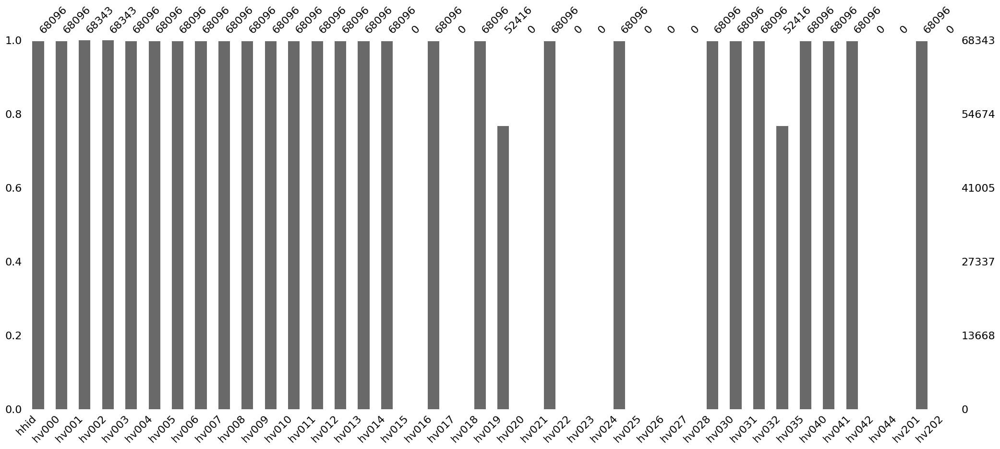

In [40]:
# Select the first 40 columns
first_40_columns = dhs_data.iloc[:, :40]
# Create a bar graph for missing data in the first 40 columns
plt.figure(figsize=(10, 6))
msno.bar(first_40_columns)
plt.show()

In [41]:
# Identify columns with all NaN values
columns_all_nan = dhs_data.columns[dhs_data.isna().all()]

# Count columns with all NaN values
count_all_nan_columns = len(columns_all_nan)

# Print the result
print(f"Number of columns with all values as NaN: {count_all_nan_columns}")

Number of columns with all values as NaN: 6924


Since we have `6924` columns with all `NaN` values, we need to delete them. 

In [42]:
# Drop columns where all values are NaN
dhs_dropped_col_nan = dhs_data.dropna(axis=1, how='all')
print('Deletion completed successfully')

Deletion completed successfully


In [43]:
# Identify rows with all NaN values
rows_all_nan = dhs_dropped_col_nan.columns[dhs_dropped_col_nan.isna().all()]

# Count rows with all NaN values
count_all_nan_rows = len(rows_all_nan)

# Print the result
print(f"Number of rows with all values as NaN: {count_all_nan_rows}")

Number of rows with all values as NaN: 0


Let's check and visualize and  if we no longer have colomns with all `nan` values

In [44]:
# Identify columns with all NaN values
columns_all_nan = dhs_dropped_col_nan.columns[dhs_dropped_col_nan.isna().all()]

# Count columns with all NaN values
count_all_nan_columns = len(columns_all_nan)
# Print the result
print(f"Number of columns with all values as NaN: {count_all_nan_columns}")

Number of columns with all values as NaN: 0


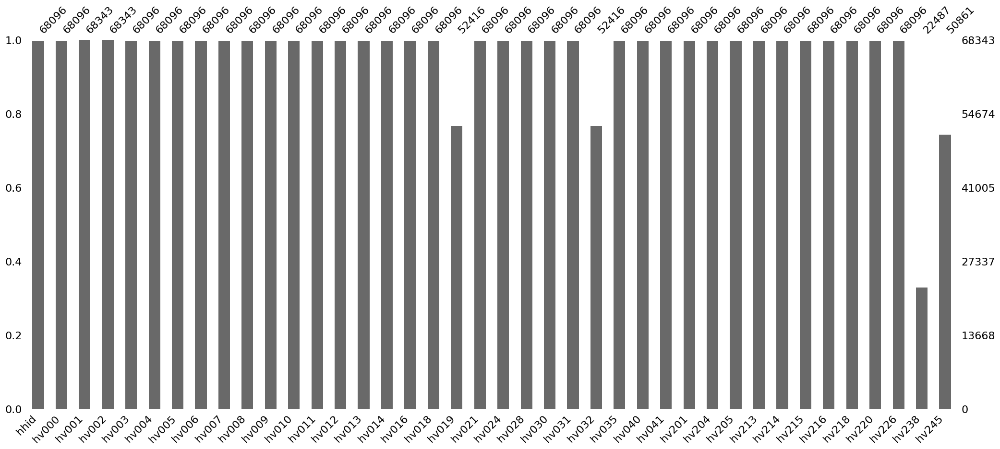

In [45]:
# Select the first 40 columns
first_40_columns = dhs_dropped_col_nan.iloc[:, :40]
# Create a bar graph for missing data in the first 40 columns
plt.figure(figsize=(10, 6))
msno.bar(first_40_columns)
plt.show()

In [46]:
# Count rows and columns to be saved
dhs_dropped_col_nan.shape

(68343, 1963)

Now that we our cleaned data, let's save it to csv file for further processing steps.

In [47]:
# Define the chunk size (number of rows per chunk)
chunksize = 5000

# Save the DataFrame to a CSV file in chunks
for i in range(0, len(dhs_dropped_col_nan), chunksize):
    dhs_dropped_col_nan.iloc[i:i+chunksize].to_csv('/kaggle/working/dhs_cleaned.csv', mode='a', header=(i == 0), index=False)

print('successfully saved dhs_cleaned.csv to /kaggle/working')

successfully saved dhs_cleaned.csv to /kaggle/working
